1. **Upload all the images supplied with assignment 2 to google drive.**
2. **Mount the drive using this code section.**
3. **Please take care of the path of the file while running this code.**

In [14]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive


**Import all the required modules**

In [15]:
from cv2 import imread
import numpy as np
import math
from google.colab.patches import cv2_imshow
import random

**Open a csv file (from google drive) in write mode**

**If the file is not there, a new csv file will be automatically created with filename as embedded in the path below.**

In [16]:
# Open the file write mode to write required attributes
fptr = open("My Drive/CV_asgnmnt2_Images/CV_Assignment2_Data.csv","w")
fptr.write(" Image Number , Task Number , Value of p , Average Hue of Original Image (In degrees) , Average Hue of Modified Image (In degrees) ,Average Intensity of Original Image , Average Intensity of Modified Image , Average Saturation of Original Image (in %) , Average Saturation of Modified Image (in %) ")
fptr.close()

**Following code will calculate the required parameters of all the images and all the cases.**



Original Image


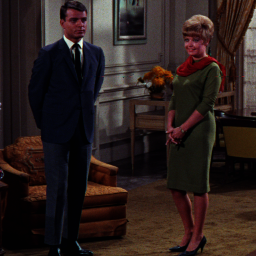



 p =  0.93


Case 1: Image after the multiplication of Image with p



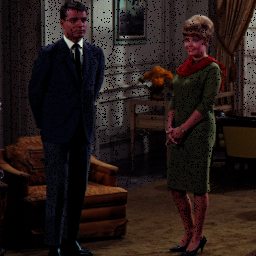





Image in second case:



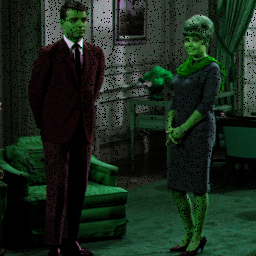





Case3: Image in the case of Gray world assumption:



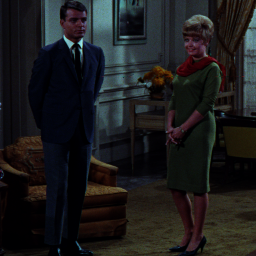





Original Image


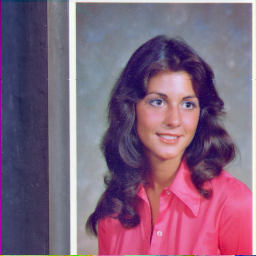



 p =  0.4


Case 1: Image after the multiplication of Image with p



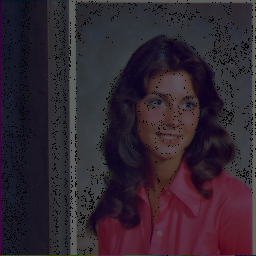





Image in second case:



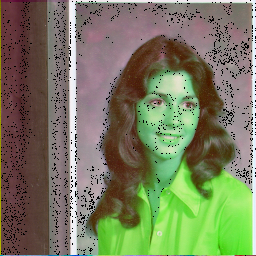





Case3: Image in the case of Gray world assumption:



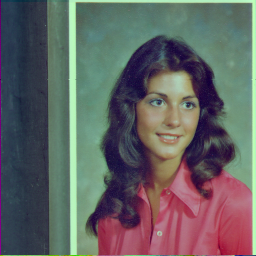





Original Image


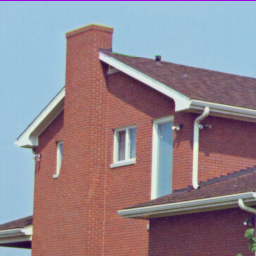



 p =  0.22


Case 1: Image after the multiplication of Image with p



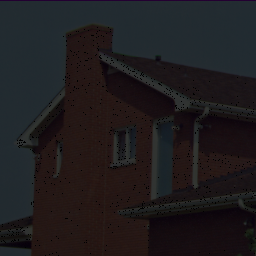





Image in second case:



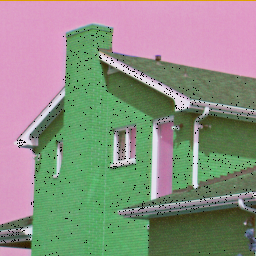





Case3: Image in the case of Gray world assumption:



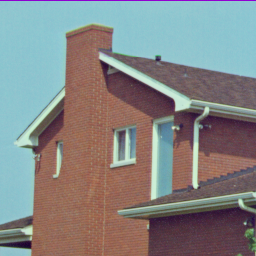





Original Image


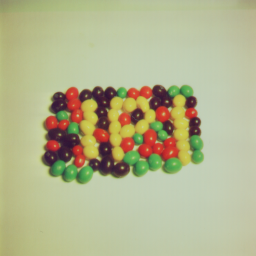



 p =  0.96


Case 1: Image after the multiplication of Image with p



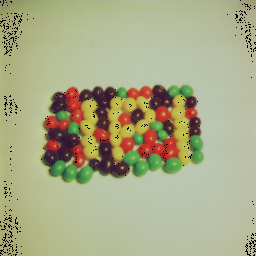





Image in second case:



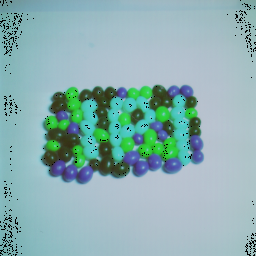





Case3: Image in the case of Gray world assumption:



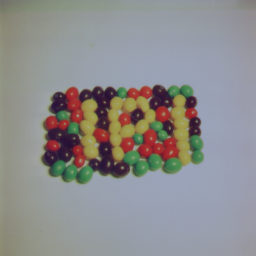





Original Image


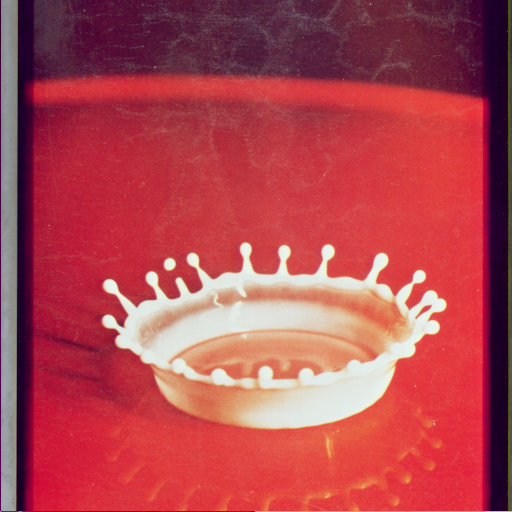



 p =  0.58


Case 1: Image after the multiplication of Image with p



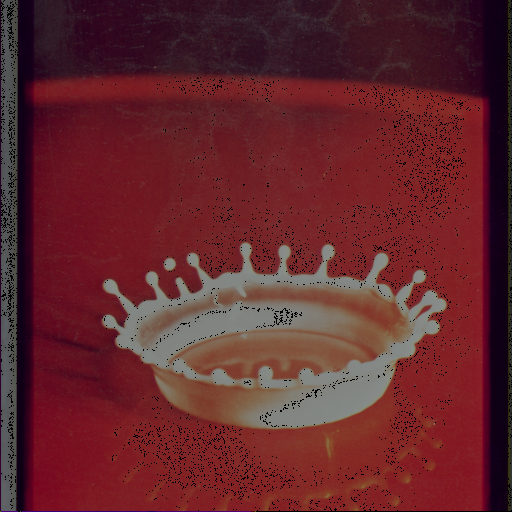





Image in second case:



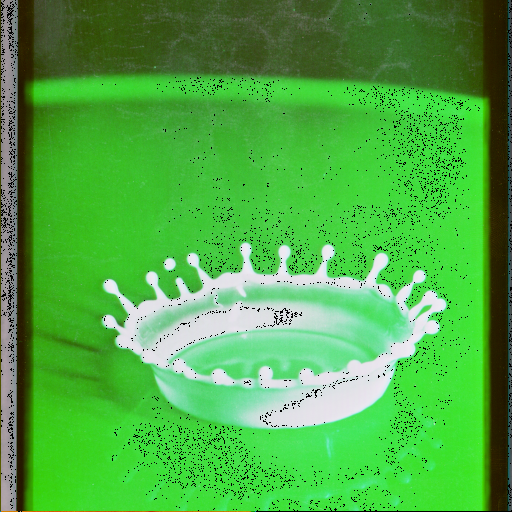





Case3: Image in the case of Gray world assumption:



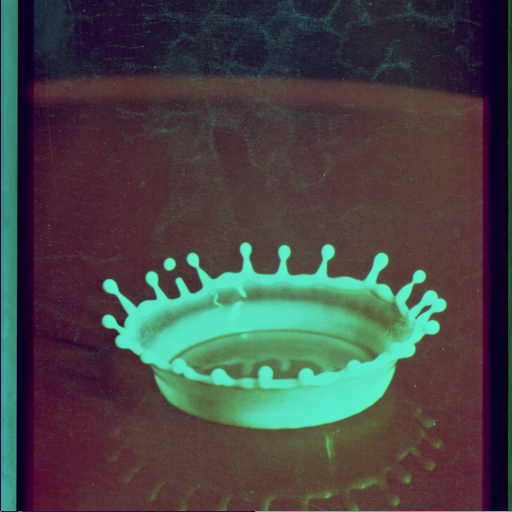





Original Image


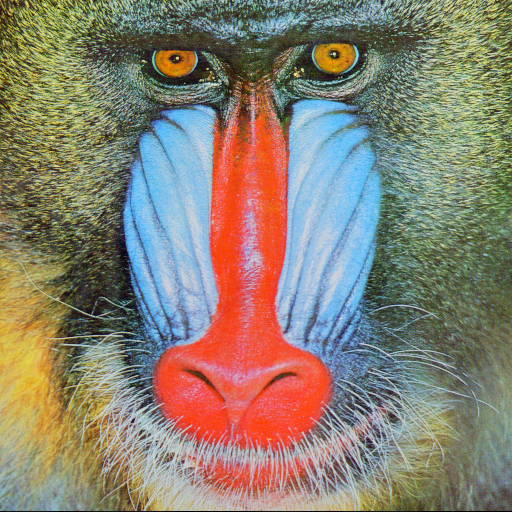



 p =  0.94


Case 1: Image after the multiplication of Image with p



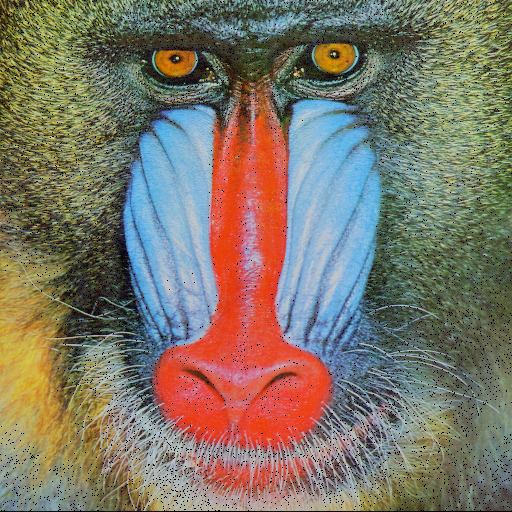





Image in second case:



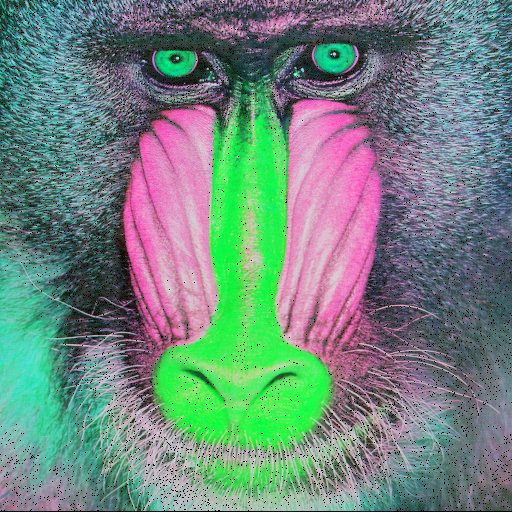





Case3: Image in the case of Gray world assumption:



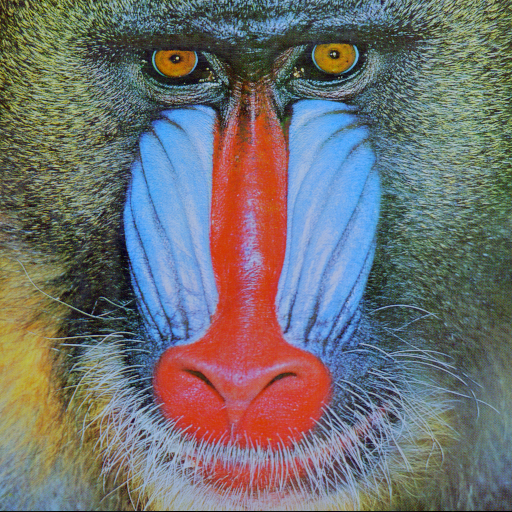





Original Image


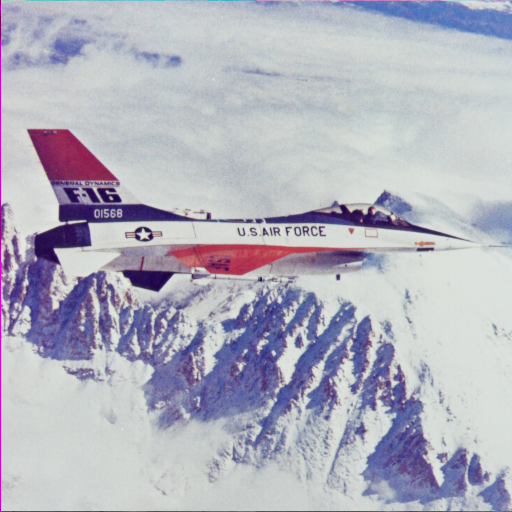



 p =  0.06


Case 1: Image after the multiplication of Image with p



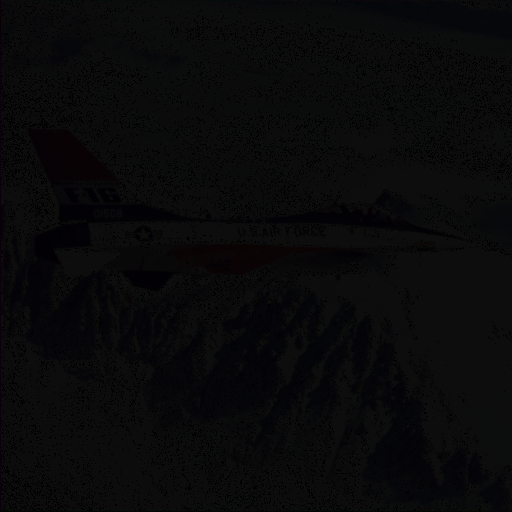





Image in second case:



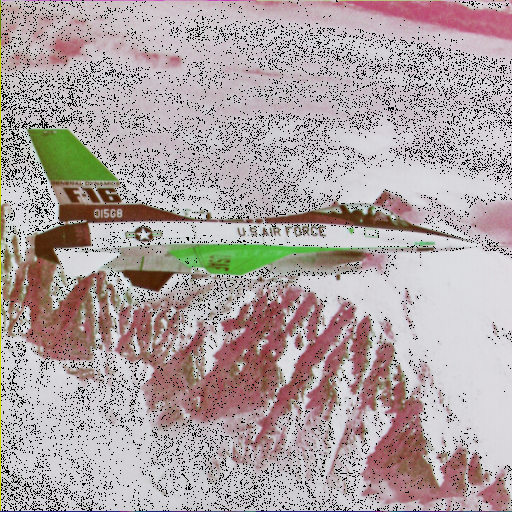





Case3: Image in the case of Gray world assumption:



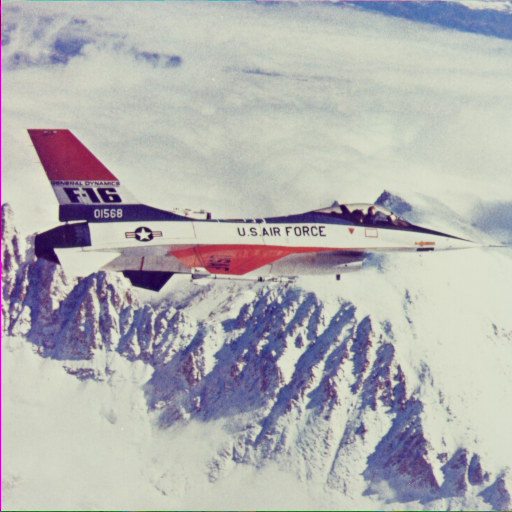





Original Image


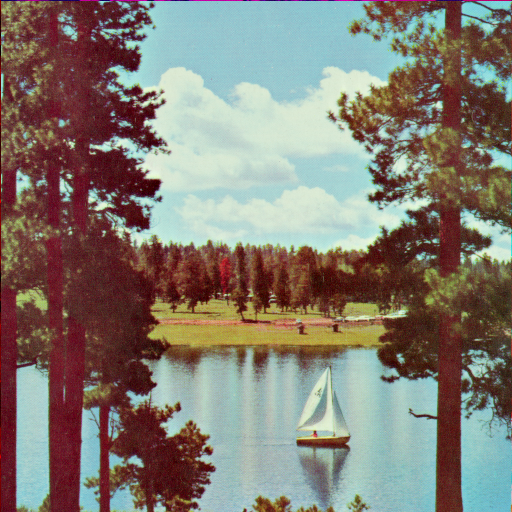



 p =  0.3


Case 1: Image after the multiplication of Image with p



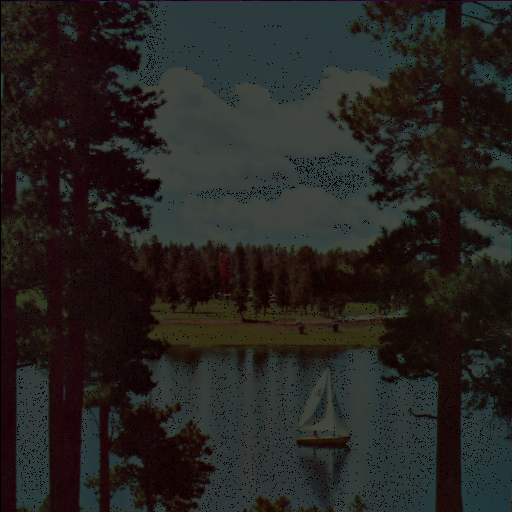





Image in second case:



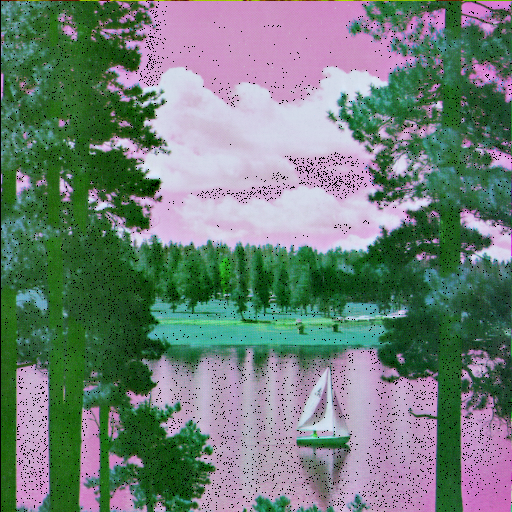





Case3: Image in the case of Gray world assumption:



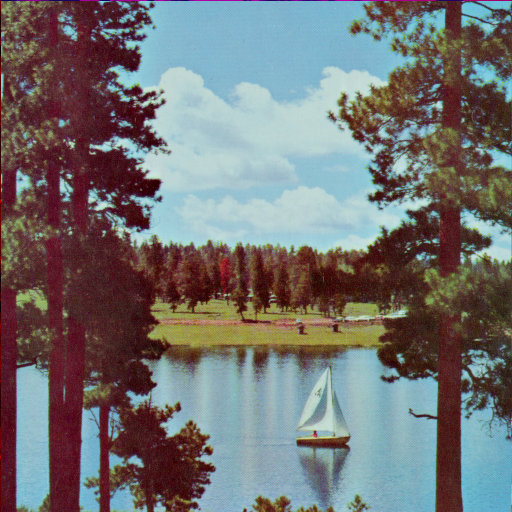





Original Image


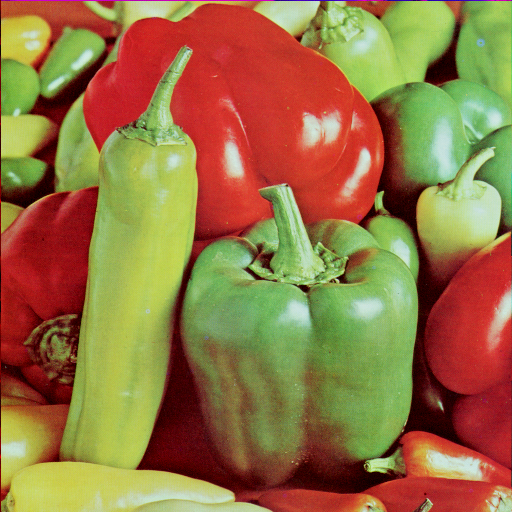



 p =  0.55


Case 1: Image after the multiplication of Image with p



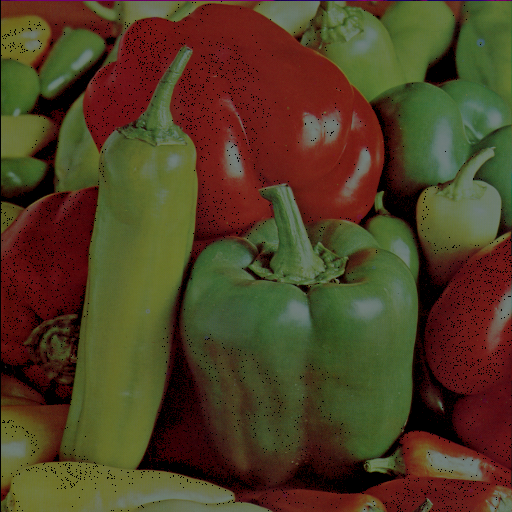





Image in second case:



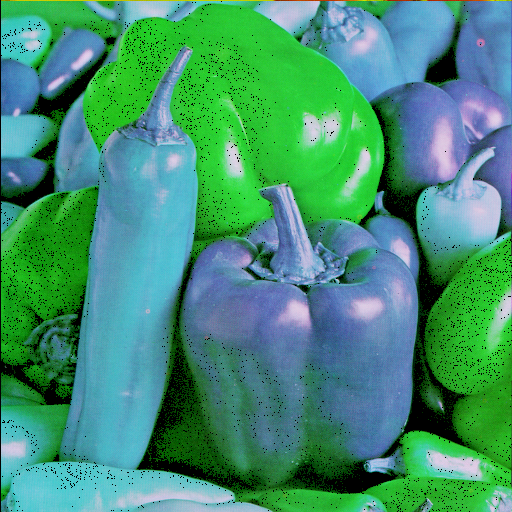





Case3: Image in the case of Gray world assumption:



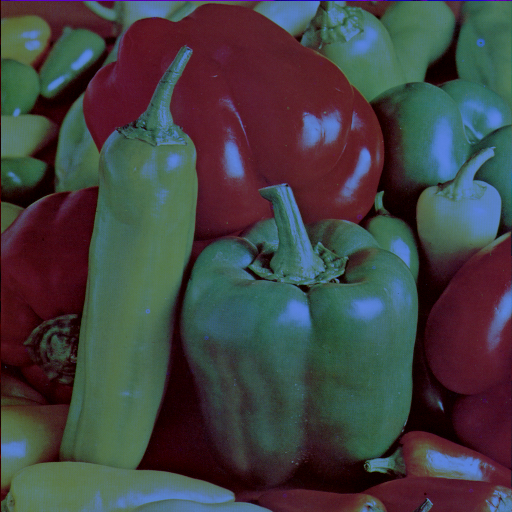





Original Image


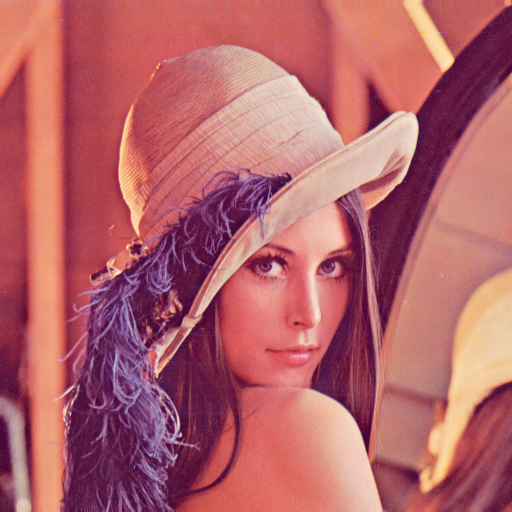



 p =  0.29


Case 1: Image after the multiplication of Image with p



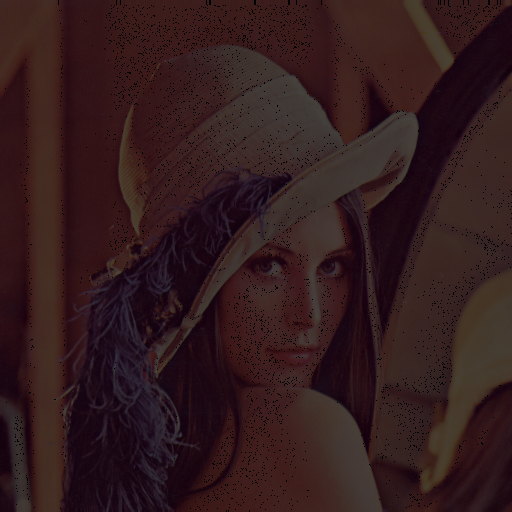





Image in second case:



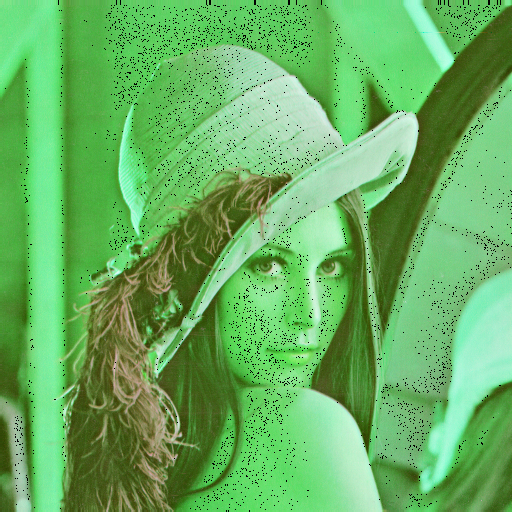





Case3: Image in the case of Gray world assumption:



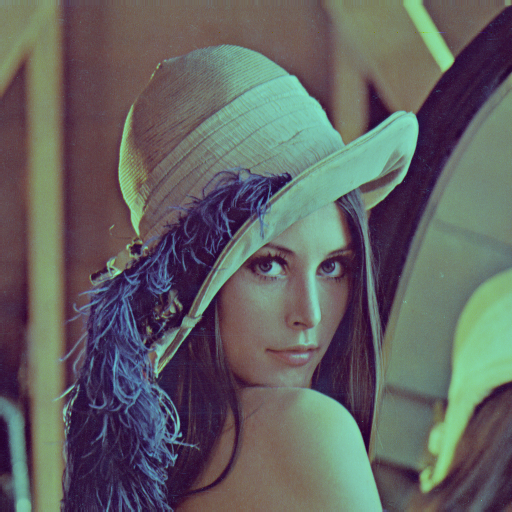

In [17]:
# Images in the assignment are named from 1 to 10. It will increment by 1 everytime loop runs.
Image_Number = 0

# This loop will repeat itself for all the 10 images
for m in range(10):
  # Code to read the original image from google drive
  Image_Number += 1
  Image_Number = str(Image_Number)                                    
  path = "My Drive/CV_asgnmnt2_Images/" + Image_Number + ".tiff"      # Warning: Modify 'path' according to your conditions. Code may throw an error if 'path' is not correct.
  Image = imread(path)
  Image_Number = int(Image_Number)


  # Shows the original image
  print("\n")
  print("Original Image")
  cv2_imshow(Image)
  print("\n")


  # Calculation of R,G and B components of original image
  R = Image[:,:,0]/255
  G = Image[:,:,1]/255
  B = Image[:,:,2]/255


  # Case number refers to the task given in the assignment
  Case_Number = 0

  # This loop repeats itself for all the three cases.
  for n in range(3):
    Case_Number += 1
    if Case_Number == 1:
      # Assign any random value to p between 0 and 1.
      p = random.randrange(1,100)
      p /= 100
      print(" p = ",p)

      # Create a zero matrix of the size of the image
      Image_dash = np.zeros([len(Image),len(Image[0]),3])

      # Scale the image by factor by p
      for i in range(len(Image)):
        for j in range(len(Image[0])):
          if R[i,j] != G[i,j] != B[i,j]:
            Image_dash[i,j,0] = Image[i,j,0]*p
            Image_dash[i,j,1] = Image[i,j,1]*p
            Image_dash[i,j,2] = Image[i,j,2]*p


      # Calculation of R_dash,G_dash and B_dash
      R_dash = Image_dash[:,:,0]/255
      G_dash = Image_dash[:,:,1]/255
      B_dash = Image_dash[:,:,2]/255


      # Shows images after scaling by p
      print("\n")
      print("Case 1: Image after the multiplication of Image with p\n")
      cv2_imshow(Image_dash)
      print("\n")


    elif Case_Number == 2:
      p = "Not Applicable"

      # Create a zero matrix of the size of the image
      Image_dash = np.zeros([len(Image),len(Image[0]),3])

      for i in range(len(Image_dash)):
        for j in range(len(Image_dash[0])):
          if R[i,j] != G[i,j] != B[i,j]:
            Image_dash[i,j,0] = Image[i,j,0] + (G[i,j] - R[i,j])*255
            Image_dash[i,j,1] = Image[i,j,1] + (B[i,j] - G[i,j])*255
            Image_dash[i,j,2] = Image[i,j,2] + (R[i,j] - B[i,j])*255

      # Calculation of R_dash,G_dash and B_dash
      R_dash = Image_dash[:,:,0]/255
      G_dash = Image_dash[:,:,1]/255
      B_dash = Image_dash[:,:,2]/255

      # Shows the image in the second case
      print("\n")
      print("Image in second case:\n")
      cv2_imshow(Image_dash)
      print("\n")


    elif Case_Number == 3:
      p = "Not Applicable"

      # Calcuation of average values of R,G and B
      R_avg = (np.sum(R))/(len(R)*len(R[0]))
      G_avg = (np.sum(G))/(len(G)*len(G[0]))
      B_avg = (np.sum(B))/(len(B)*len(B[0]))
      
      # Create zero matrices of size R,G and B
      R_dash = np.zeros([len(R),len(R[0])])
      G_dash = np.zeros([len(G),len(G[0])])
      B_dash = np.zeros([len(B),len(B[0])])

      # Calculation of R_dash,G_dash and B_dash
      for i in range(len(R)):
        for j in range(len(R[0])):
          R_dash[i,j] = R[i,j]*((min(R_avg,G_avg,B_avg))/R_avg)
          G_dash[i,j] = G[i,j]*((min(R_avg,G_avg,B_avg))/G_avg)
          B_dash[i,j] = B[i,j]*((min(R_avg,G_avg,B_avg))/B_avg)

      # Generation of an image according to the gray world assumption algorithm
      Image_dash = np.zeros([len(Image),len(Image[0]),3])
      Image_dash[:,:,0] = R_dash*255
      Image_dash[:,:,1] = G_dash*255
      Image_dash[:,:,2] = B_dash*255


      # Shows image in the third case
      print("\n")
      print("Case3: Image in the case of Gray world assumption:\n")
      cv2_imshow(Image_dash)
      print("\n")




    # Calculation of Hue matrix for original image
    Theta = np.zeros([len(Image),len(Image[0])])
    for i in range(len(R)):
      for j in range(len(R[0])):
        if R[i,j] != G[i,j] != B[i,j] :
          Theta[i,j] = (180/math.pi)*(math.acos((0.5*((R[i,j]-G[i,j])+(R[i,j]-B[i,j])))/(((R[i,j]-G[i,j])**2+((R[i,j]-B[i,j])*(G[i,j]-B[i,j])))**0.5)))
    H = np.zeros([len(B),len(B[0])])
    for i in range(len(B)):
      for j in range(len(B[0])):
        if B[i,j]<=G[i,j]:
          H[i,j] = Theta[i,j]
        else:
          H[i,j] = 360 - Theta[i,j]


    # Calculation of Hue matrix for Modified image
    Theta_dash = np.zeros([len(Image_dash),len(Image_dash[0])])
    for i in range(len(R_dash)):
      for j in range(len(R_dash[0])):
        if R_dash[i,j] != G_dash[i,j] != B_dash[i,j] :
          ratio = (0.5*((R_dash[i,j]-G_dash[i,j])+(R_dash[i,j]-B_dash[i,j])))/(((R_dash[i,j]-G_dash[i,j])**2+((R_dash[i,j]-B_dash[i,j])*(G_dash[i,j]-B_dash[i,j])))**0.5)
          if -1 < ratio < 1:
            Theta_dash[i,j] = (180/math.pi)*(math.acos((ratio)))
    H_dash = np.zeros([len(B_dash),len(B_dash[0])])
    for i in range(len(B_dash)):
      for j in range(len(B_dash[0])):
        if B_dash[i,j]<=G_dash[i,j]:
          H_dash[i,j] = Theta_dash[i,j]
        else:
          H_dash[i,j] = 360 - Theta_dash[i,j]


    # Calculation of Intensity matrix for Original image
    I = np.zeros([len(R),len(R[0])])
    for i in range(len(R)):
      for j in range(len(R[0])):
        if R[i,j] != G[i,j] != B[i,j]:
          if (R[i,j]>0) and (G[i,j]>0) and (B[i,j]>0):    
            I[i,j] = (R[i,j] + G[i,j] + B[i,j])/3
            I[i,j] = I[i,j]*255


    # Calculation of Intensity matrix for Modified image 
    I_dash = np.zeros([len(R_dash),len(R_dash[0])])
    for i in range(len(R_dash)):
      for j in range(len(R_dash[0])):
        # if R_dash[i,j] != G_dash[i,j] != B_dash[i,j]:
        if (R_dash[i,j]>0) and (G_dash[i,j]>0) and (B_dash[i,j]>0):    
          I_dash[i,j] = (R_dash[i,j] + G_dash[i,j] + B_dash[i,j])/3
          I_dash[i,j] = I_dash[i,j]*255



    # Calculation of Saturation matrix for Original Image
    S = np.zeros([len(Image),len(Image[0])])
    for i in range(len(R)):
      for j in range(len(R[0])):
        if I[i,j] > 0:
          S[i,j] = 1 - ((min(R[i,j],G[i,j],B[i,j]))/(I[i,j]))
          S[i,j] = S[i,j]*100


    # Calculation of Saturation matrix for modified Image
    S_dash = np.zeros([len(Image_dash),len(Image_dash[0])])
    for i in range(len(Image_dash)):
      for j in range(len(Image_dash[0])):
        if I_dash[i,j] > 0:
          S_dash[i,j] = 1 - ((min(R_dash[i,j],G_dash[i,j],B_dash[i,j]))/(I_dash[i,j]))
          S_dash[i,j] = S_dash[i,j]*100


    # Average Hue of original image
    Average_Hue_Image = np.sum(H)/(len(H)*len(H[0]))

    # Average Hue of modified image
    Average_Hue_Image_dash = np.sum(H_dash)/(len(H_dash)*len(H_dash[0]))


    # Average saturation of original image
    Average_Saturation_Image = np.sum(S)/(len(S)*len(S[0]))

    # Average saturation of modified image
    Average_Saturation_Image_dash = np.sum(S_dash)/(len(S_dash)*len(S_dash[0]))


    # Average intensity of original image
    Average_Intensity_Image = np.sum(I)/(len(I)*len(I[0]))


    # Average intensity of modified image
    Average_Intensity_Image_dash = np.sum(I_dash)/(len(I_dash)*len(I_dash[0]))


    # OPEN THE FILE APPEND MODE
    # The above calculated values keep appending in the file for all the 10 images and for all the 3 cases.
    fptr = open("My Drive/CV_asgnmnt2_Images/CV_Assignment2_Data.csv","a")
    fptr.write("\n")
    fptr.write(f"{Image_Number},{Case_Number},{p},{Average_Hue_Image},{Average_Hue_Image_dash},{Average_Intensity_Image},{Average_Intensity_Image_dash},{Average_Saturation_Image},{Average_Saturation_Image_dash}")
    fptr.close()


